In [1]:
import pandas as pd
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime

In [2]:
empa_path = "Empatica"
fitbit_path = "Fitbit"
empa_rest_cols = ["Timestamp.time", "HR_biosignalsplux", "HR_empatica", "Prediction_['PA_lvl_VectorA_empatica_encoded', 'HR_empatica']", "Prediction_['HR_empatica']"]
empa_intense_cols = ["Timestamp.time", "HR_empatica", "Prediction_['PA_lvl_VectorA_empatica_encoded', 'HR_empatica']", "Prediction_['HR_empatica']", "HR_polarh10"]
fitbit_rest_cols = ["Timestamp.time", "HR_biosignalsplux", "HR_fitbit", "Prediction_['PA_lvl_VectorA_empatica_encoded', 'HR_fitbit']", "Prediction_['HR_fitbit']"]
fitbit_intense_cols = ["Timestamp.time", "HR_fitbit", "Prediction_['PA_lvl_VectorA_empatica_encoded', 'HR_fitbit']", "Prediction_['HR_fitbit']", "HR_polarh10"]

In [3]:
sub_path = os.path.join(empa_path, "Resting")
empa_files = os.listdir(sub_path)
for d in empa_files:
    a = pd.read_csv(os.path.join(sub_path, d))
    tmp_cols = a.columns.tolist()
    is_complete = True
    for cols in empa_rest_cols:
        if cols not in tmp_cols:
            print(cols)
            is_complete = False
    if not is_complete:
        continue

Timestamp.time
Prediction_['PA_lvl_VectorA_empatica_encoded', 'HR_empatica']
Prediction_['HR_empatica']
Timestamp.time
Prediction_['PA_lvl_VectorA_empatica_encoded', 'HR_empatica']
Prediction_['HR_empatica']


In [4]:
def plot_empatica(sub):
    sub_path = os.path.join(empa_path, sub)
    empa_files = os.listdir(sub_path)
    empa_files.sort()
    
    tmp_data = [(file, pd.read_csv(os.path.join(sub_path, file))) for file in empa_files]
    empa_data = []
    for data in tmp_data:
        tmp_cols = data[1].columns.tolist()
        is_complete = True
        if sub.lower() == "intensity":
            needed_cols = empa_intense_cols
        else:
            needed_cols = empa_rest_cols
        for col in needed_cols:
            if col not in tmp_cols:
                is_complete = False
        if not is_complete:
            continue
        else:
            empa_data.append((data[0], data[1][needed_cols]))
            
    
    pick_index = []
    for data in empa_data:
        pick_index.append(pick_point_to_plot(data[1],5))


    for i, data in enumerate(empa_data):
        empa_data[i] = (data[0], data[1].iloc[pick_index[i][0]: pick_index[i][1]])
    
    for data in empa_data:
        fig = plt.figure(figsize=(15,8))
        plt.plot(data[1]["Timestamp.time"], data[1]["Prediction_['PA_lvl_VectorA_empatica_encoded', 'HR_empatica']"], "y+", label="HR_empatica-prediction with PA", linestyle="-")
        plt.plot(data[1]["Timestamp.time"], data[1]["Prediction_['HR_empatica']"], "bo", label="HR_empatica-prediction without PA", linestyle="-")
        plt.plot(data[1]["Timestamp.time"], data[1]["HR_empatica"], "rs", label="HR_empatica", linestyle="-")
        
        if sub.lower() == "intensity":
            plt.plot(data[1]["Timestamp.time"], data[1]["HR_polarh10"], "g^", label="HR_polarh10", linestyle="-")
            plt.legend(("HR_empatica-prediction with PA", "HR_empatica-prediction without PA", "HR_polarh10", "HR_empatica"))
        else:
            plt.plot(data[1]["Timestamp.time"], data[1]["HR_biosignalsplux"], "g^", label="HR_biosignalsplux(ECG)", linestyle="-")
            plt.legend(("HR_empatica-prediction with PA", "HR_empatica-prediction without PA", "HR_biosignalsplux(ECG)", "HR_empatica"))
        
        plt.xticks(data[1]["Timestamp.time"], data[1]["Timestamp.time"], rotation="60")
        plt.title(data[0][:-4] + "(Empatica)")
        plt.xlabel("Time")
        plt.ylabel("Heart rate(bpm)")
        plt.show()

In [5]:
def plot_fitbit(sub):
    sub_path = os.path.join(fitbit_path, sub)
    fitbit_files = os.listdir(sub_path)
    fitbit_files.sort()
    
    tmp_data = [(file, pd.read_csv(os.path.join(sub_path, file))) for file in fitbit_files]
    fitbit_data = []
    for data in tmp_data:
        tmp_cols = data[1].columns.tolist()
        is_complete = True
        if sub.lower() == "intensity":
            needed_cols = fitbit_intense_cols
        else:
            needed_cols = fitbit_rest_cols
        for col in needed_cols:
            if col not in tmp_cols:
                print(col)
                is_complete = False
        if not is_complete:
            continue
        else:
            fitbit_data.append((data[0], data[1][needed_cols]))
    
    
    pick_index = []
    for data in fitbit_data:
        pick_index.append(pick_point_to_plot(data[1],5))


    for i, data in enumerate(fitbit_data):
        fitbit_data[i] = (data[0], data[1].iloc[pick_index[i][0]: pick_index[i][1]])
    
    for data in fitbit_data:
        fig = plt.figure(figsize=(15,8))
        plt.plot(data[1]["Timestamp.time"], data[1]["Prediction_['PA_lvl_VectorA_empatica_encoded', 'HR_fitbit']"], "y+", label="HR_fitbit-prediction with PA", linestyle="-")
        plt.plot(data[1]["Timestamp.time"], data[1]["Prediction_['HR_fitbit']"], "bo", label="HR_fitbit-prediction without PA", linestyle="-")
        plt.plot(data[1]["Timestamp.time"], data[1]["HR_fitbit"], "rs", label="HR_fitbit", linestyle="-")
        
        if sub.lower() == "intensity":
            plt.plot(data[1]["Timestamp.time"], data[1]["HR_polarh10"], "g^", label="HR_polarh10", linestyle="-")
            plt.legend(("HR_fitbit-prediction with PA", "HR_fitbit-prediction without PA", "HR_polarh10", "HR_fitbit"))
        else:
            plt.plot(data[1]["Timestamp.time"], data[1]["HR_biosignalsplux"], "g^", label="HR_biosignalsplux(ECG)", linestyle="-")
            plt.legend(("HR_fitbit-prediction with PA", "HR_fitbit-prediction without PA", "HR_biosignalsplux(ECG)", "HR_fitbit"))
        
        plt.xticks(data[1]["Timestamp.time"], data[1]["Timestamp.time"], rotation="60")
        plt.title(data[0][:-4] + "(Fitbit)")
        plt.xlabel("Time")
        plt.ylabel("Heart rate(bpm)")
        plt.show()

In [6]:
def pick_point_to_plot(data, minute):
    start = data.shape[0]//minute
    for i, t in enumerate(data["Timestamp.time"][start + 1:]):
        differ = datetime.strptime(t, "%H:%M:%S") - datetime.strptime(data["Timestamp.time"][start], "%H:%M:%S")
        if differ.total_seconds() >= 300:
            return (start, start + i + 1)
    return (0, data.shape[0] - 1)

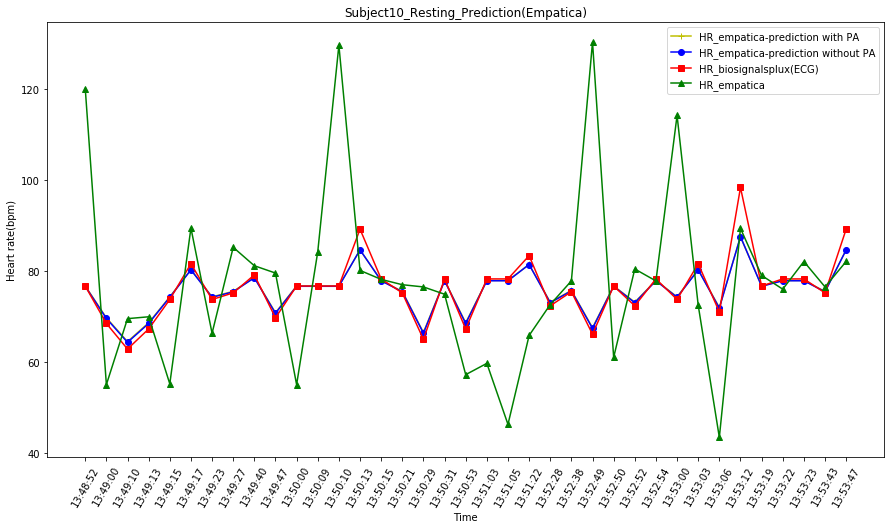

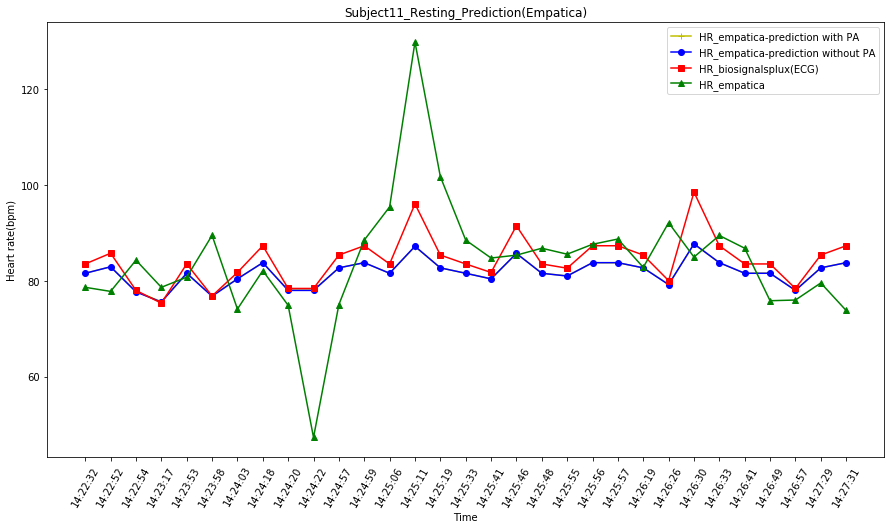

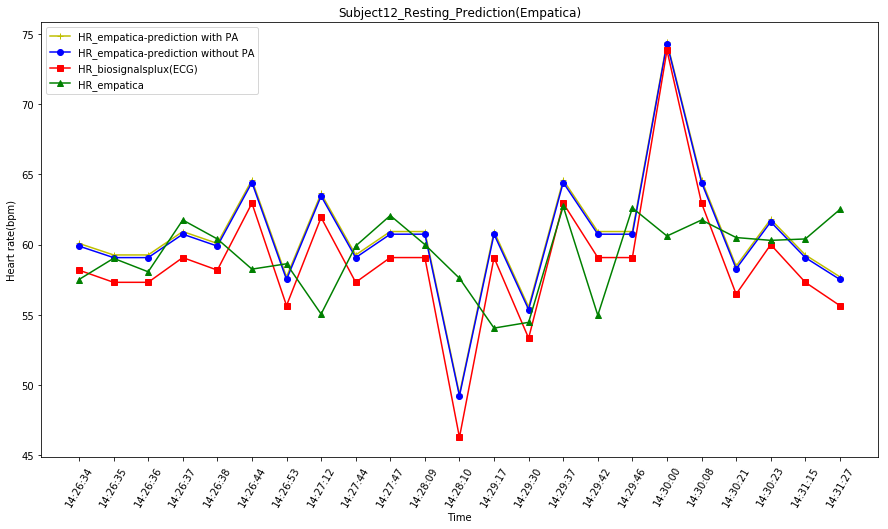

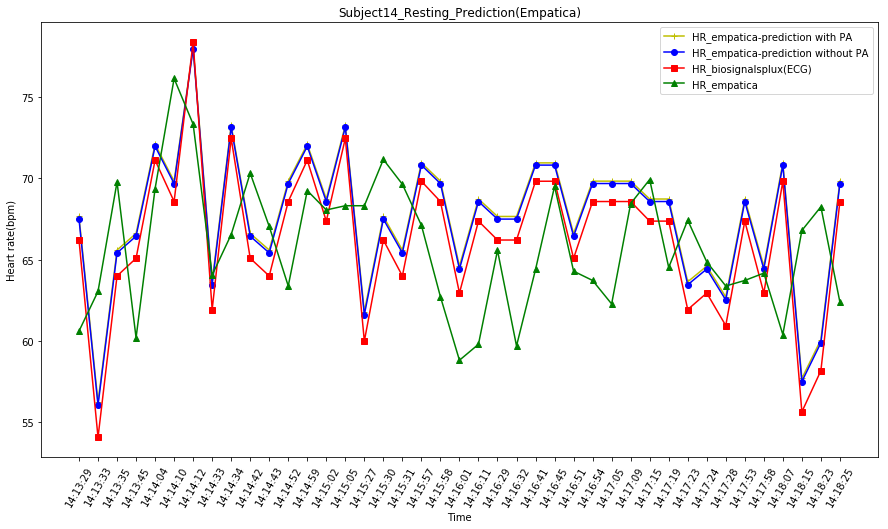

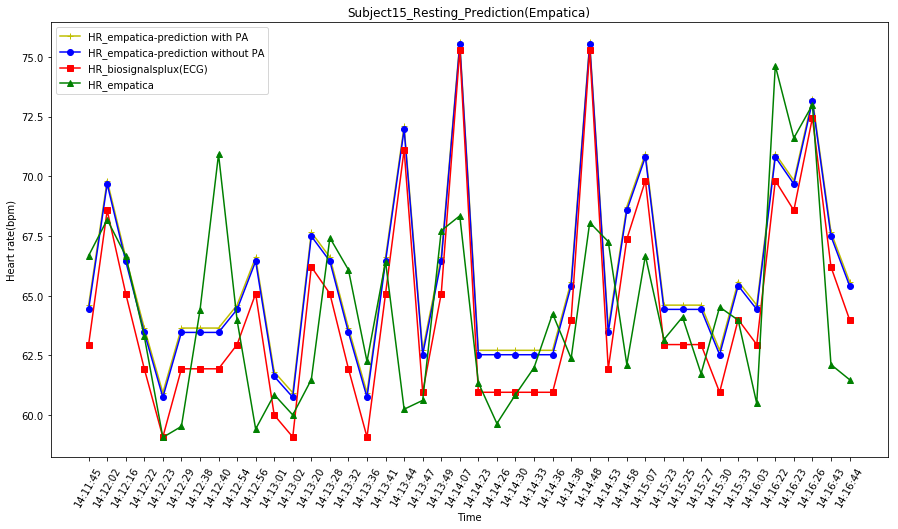

...

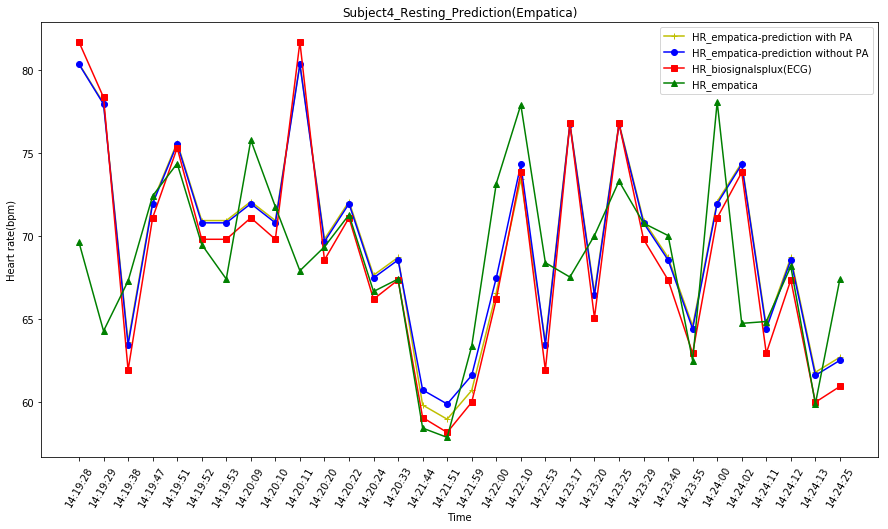

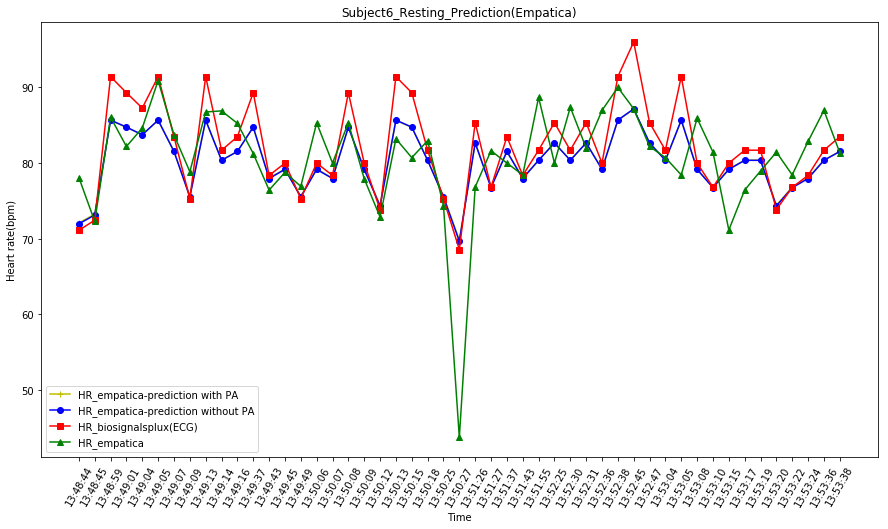

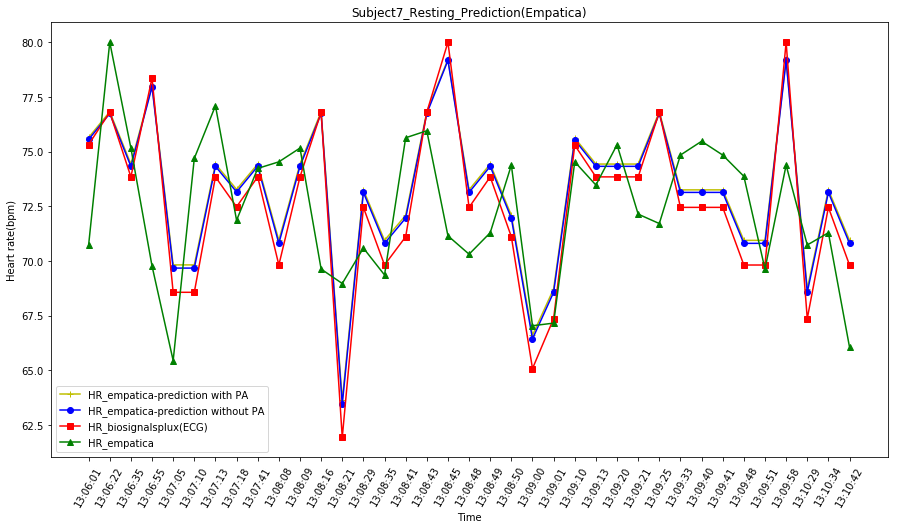

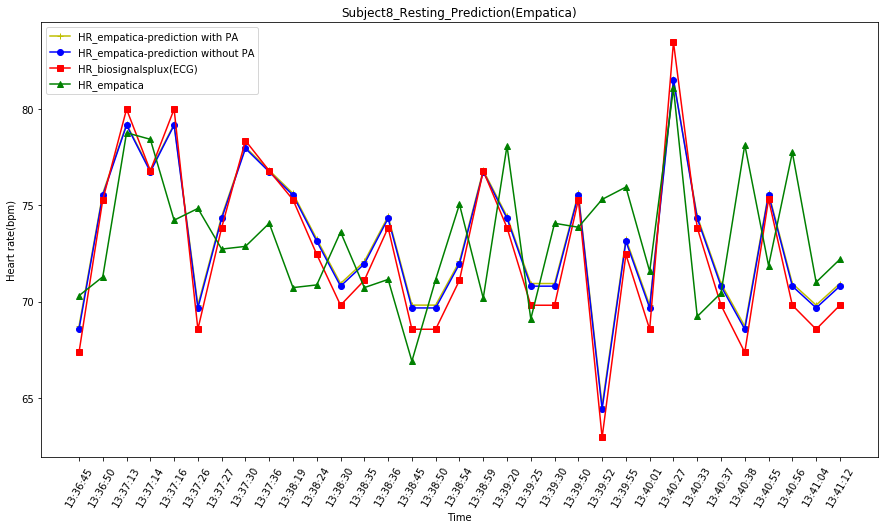

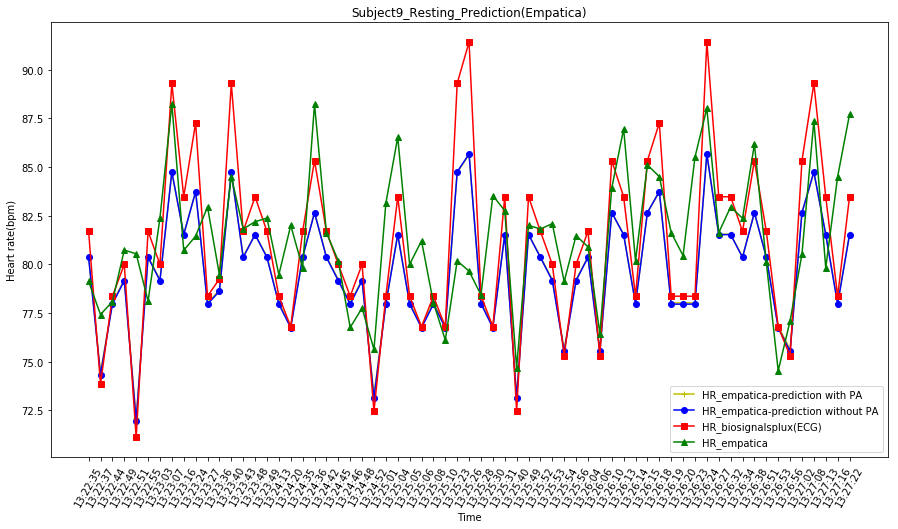

In [7]:
plot_empatica("Resting")

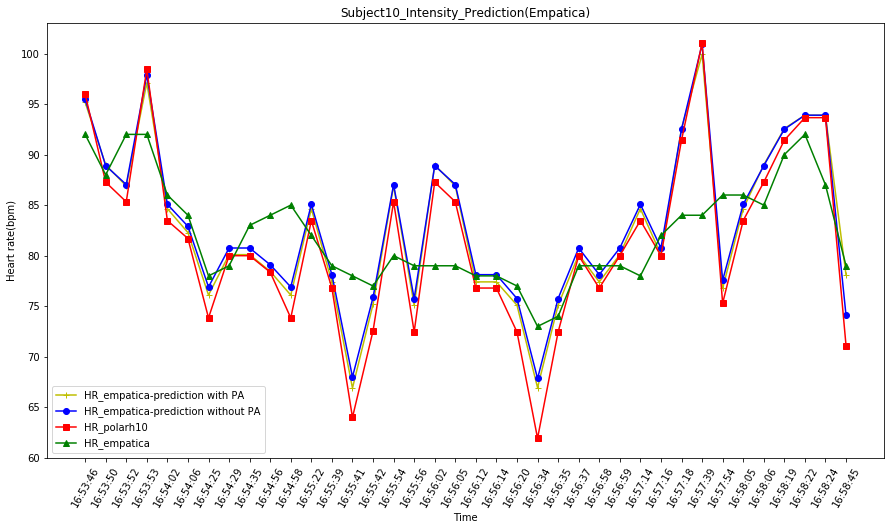

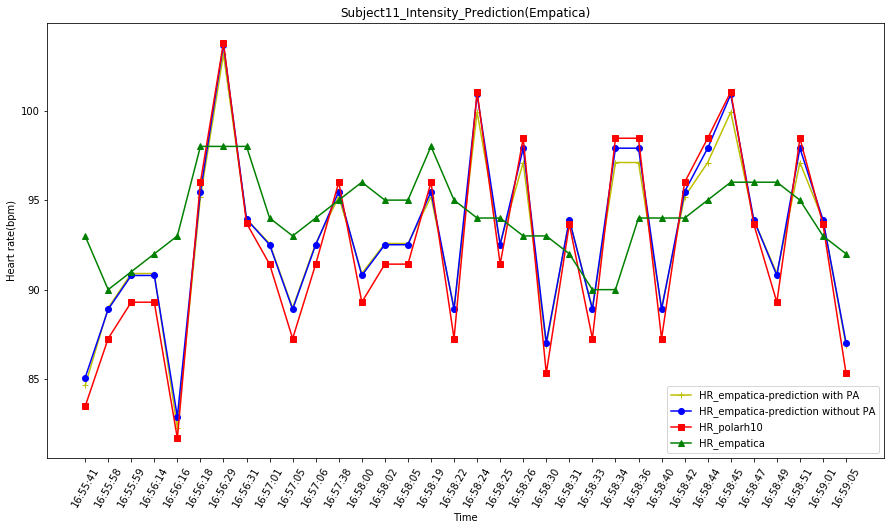

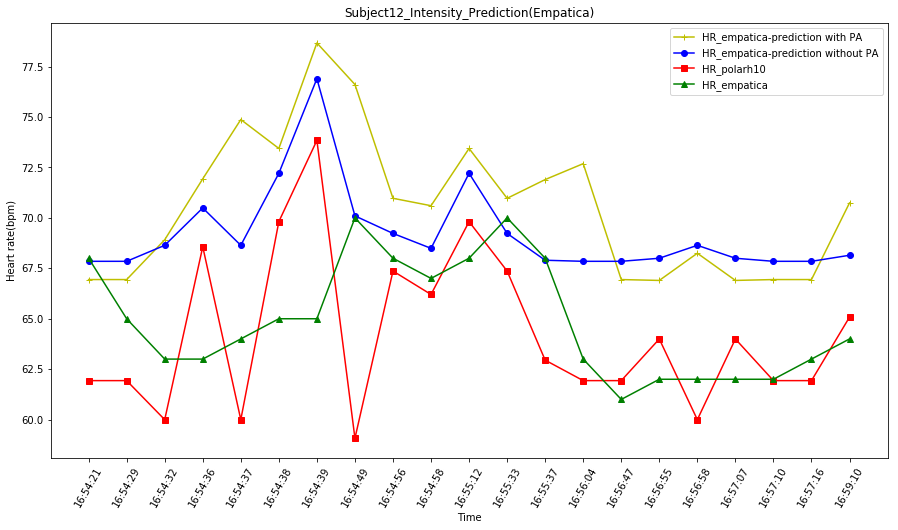

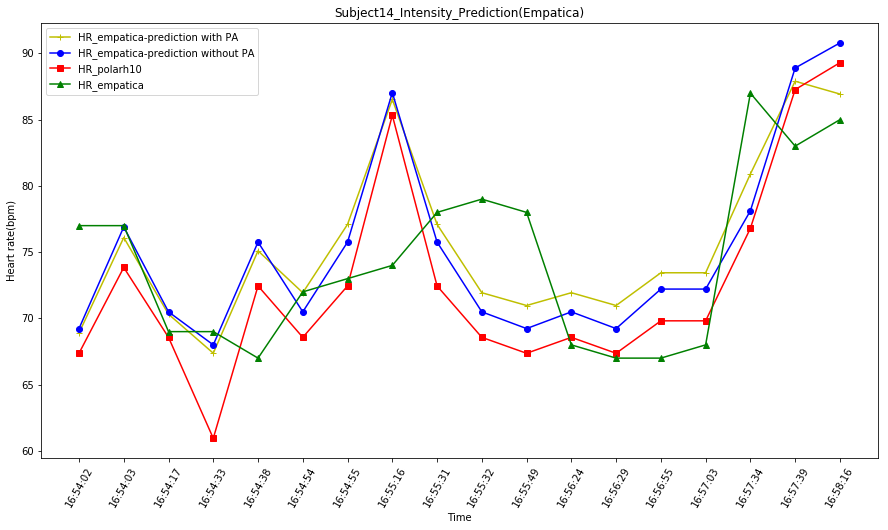

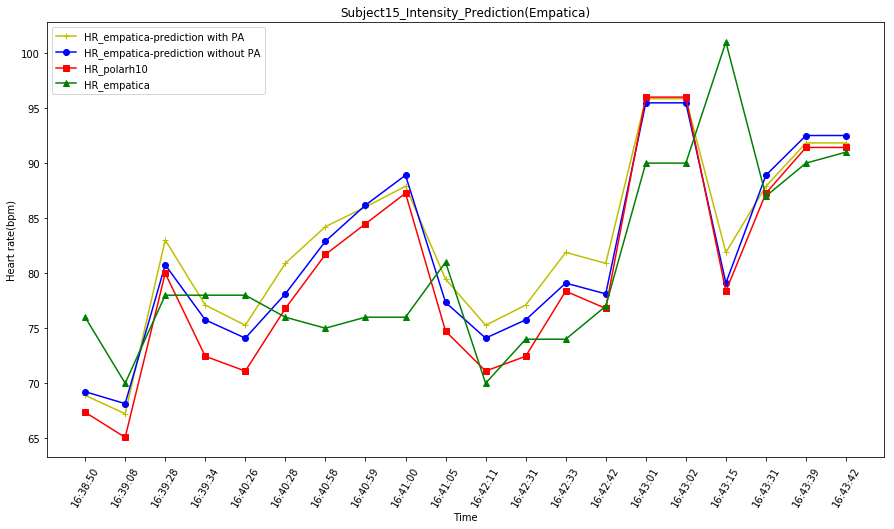

...

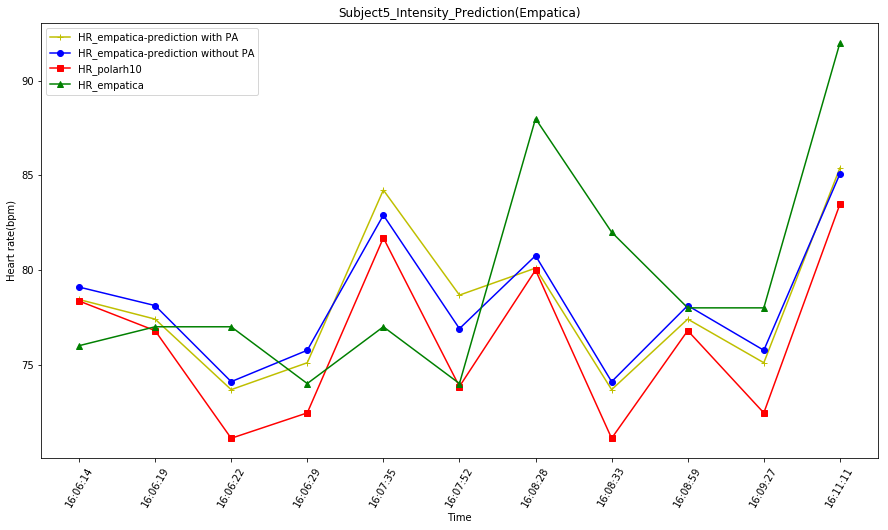

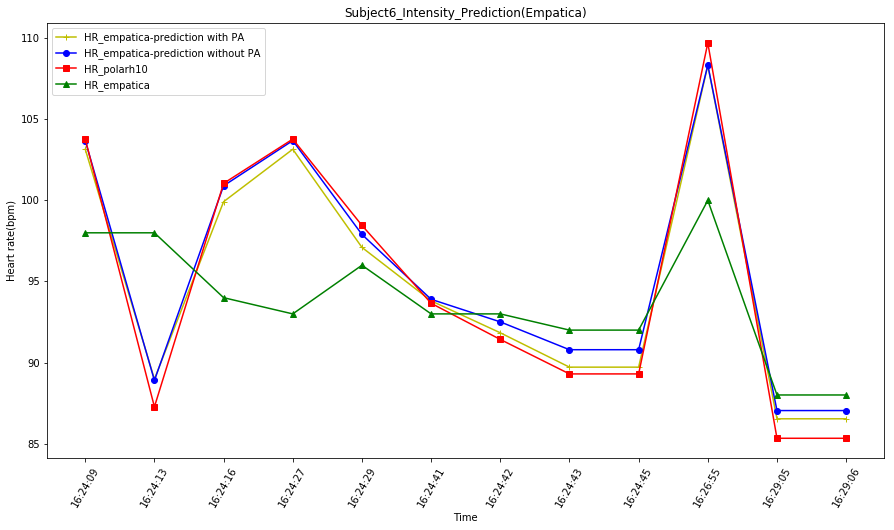

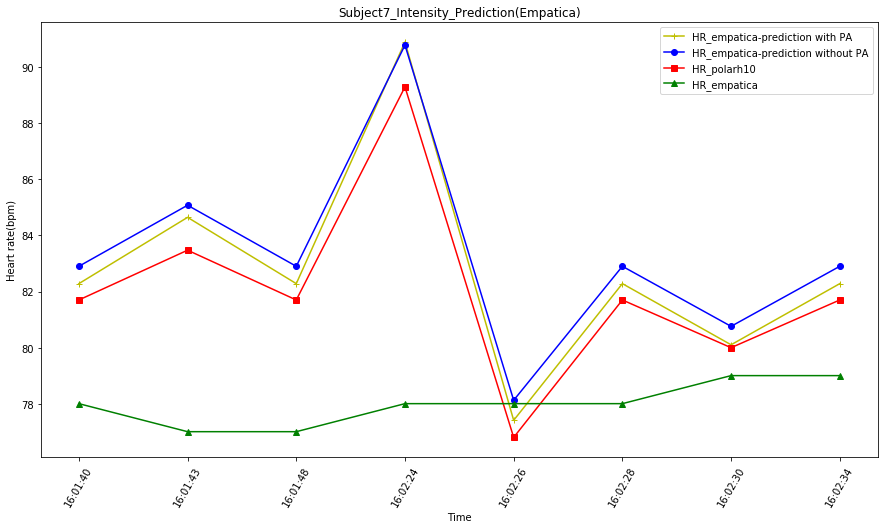

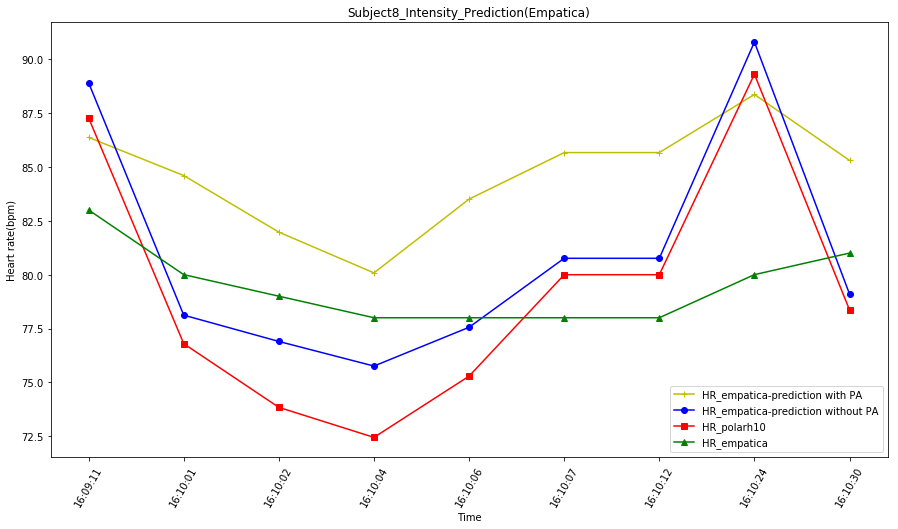

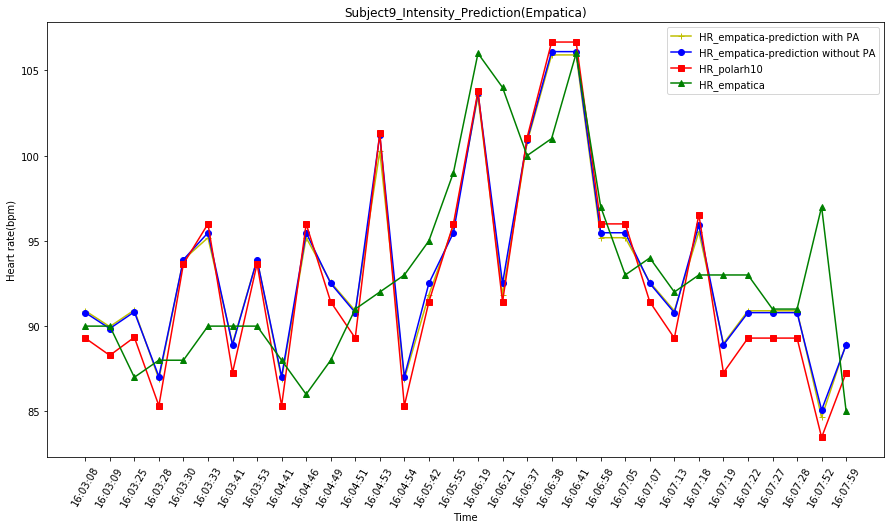

In [8]:
plot_empatica("Intensity")

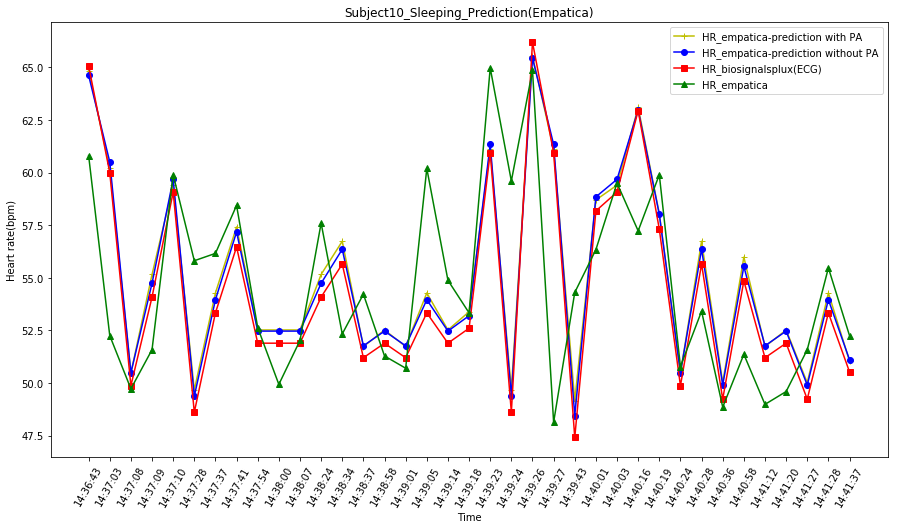

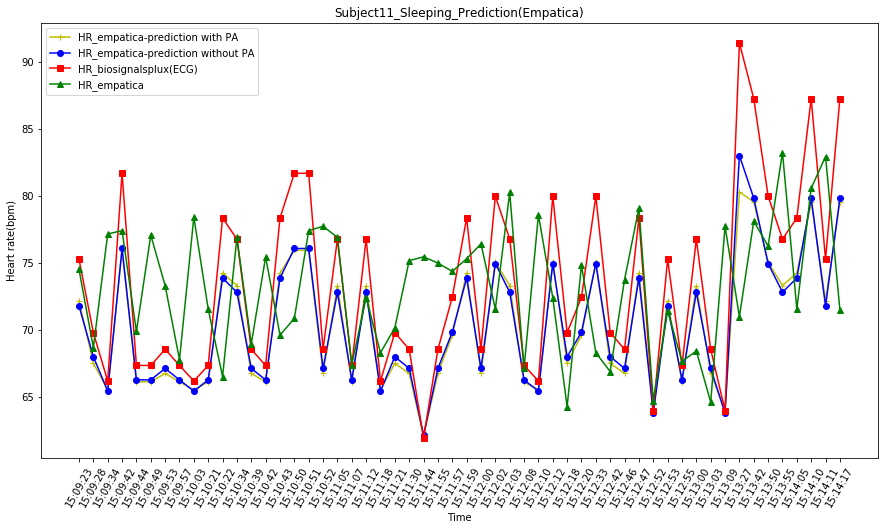

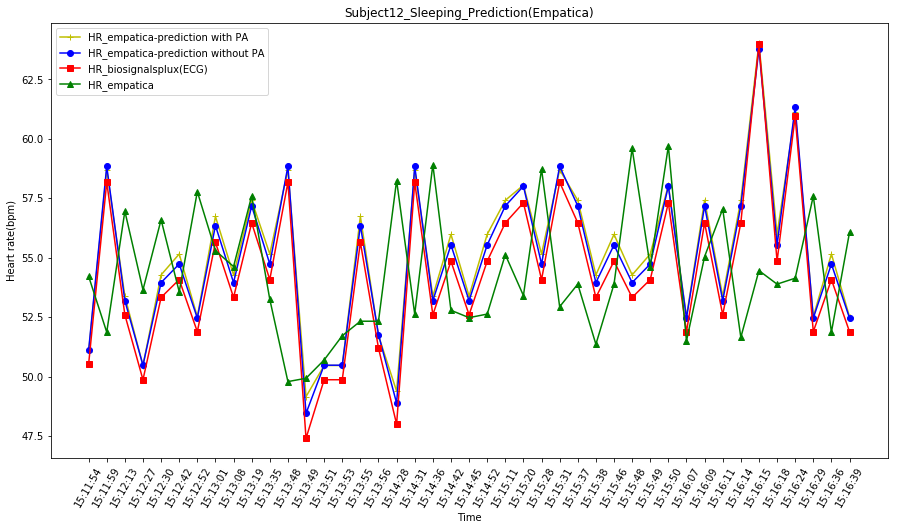

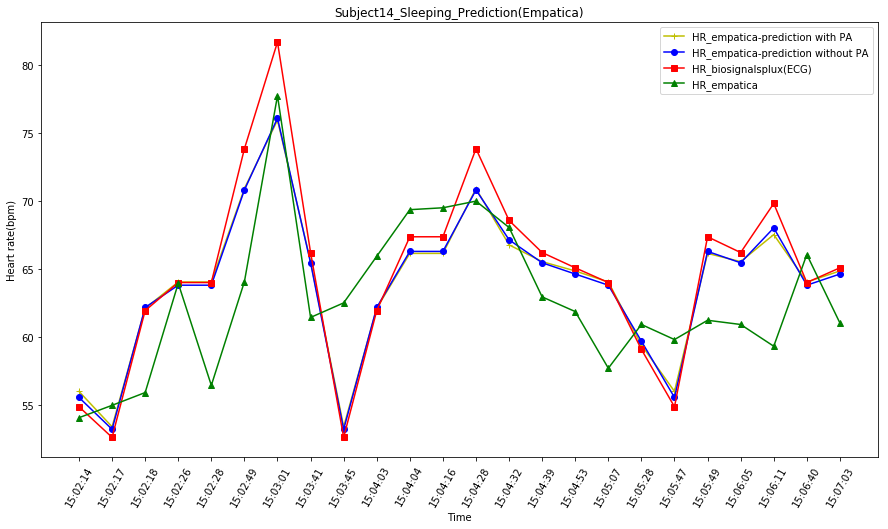

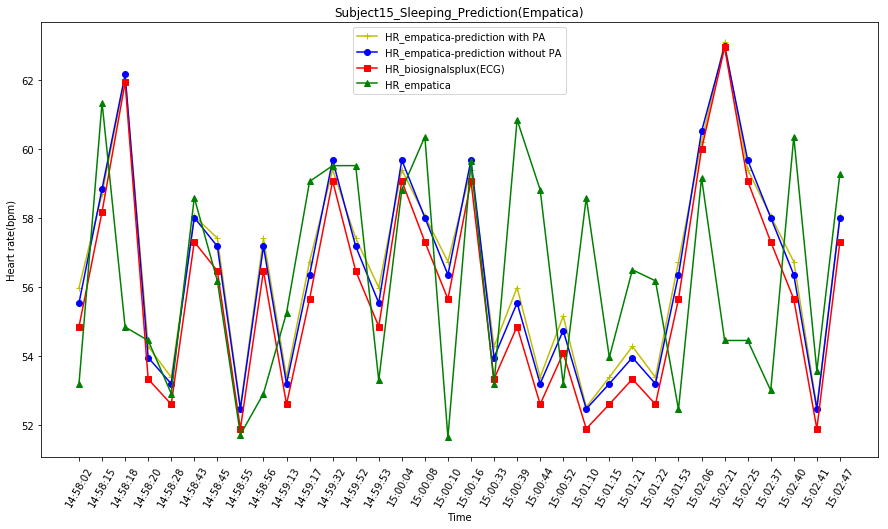

...

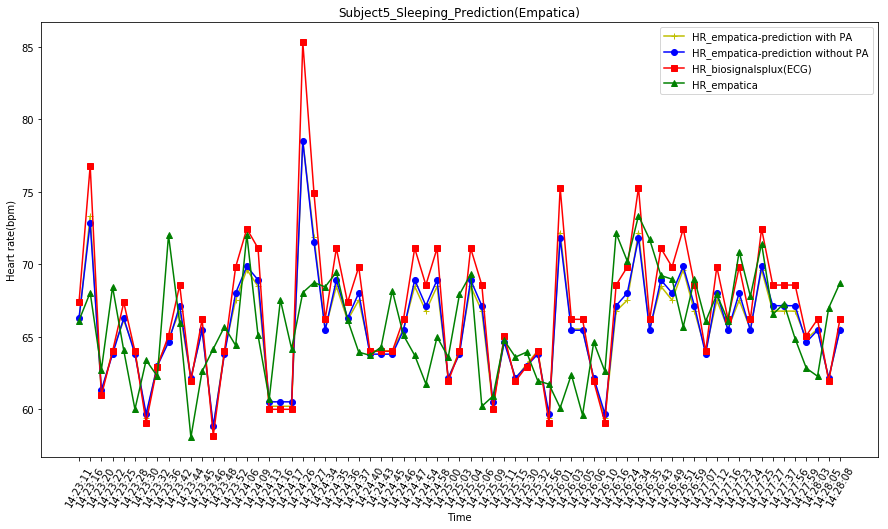

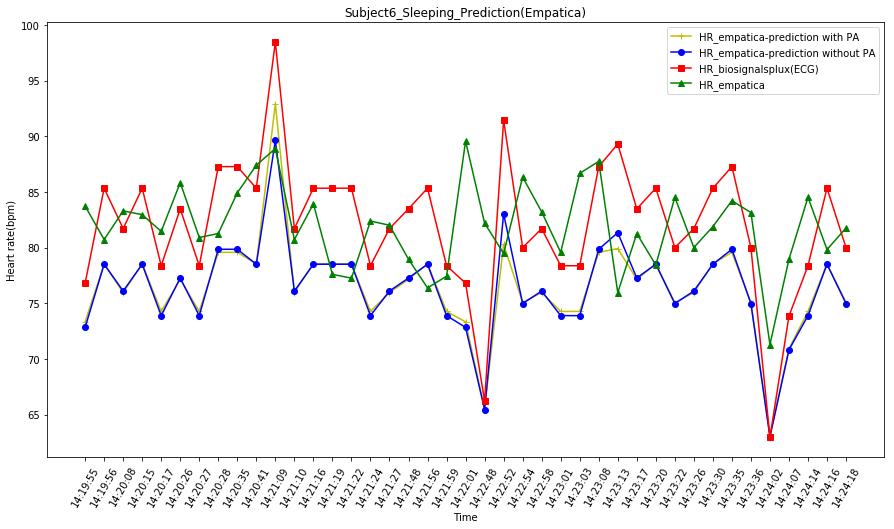

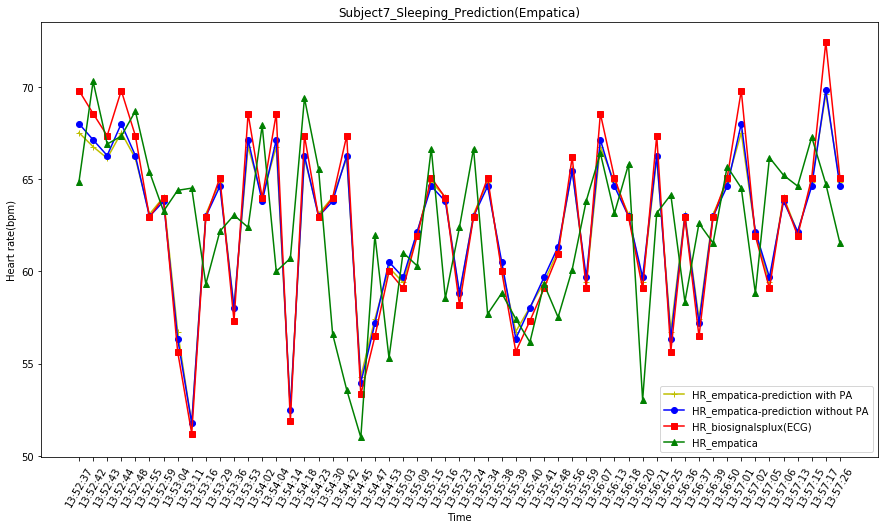

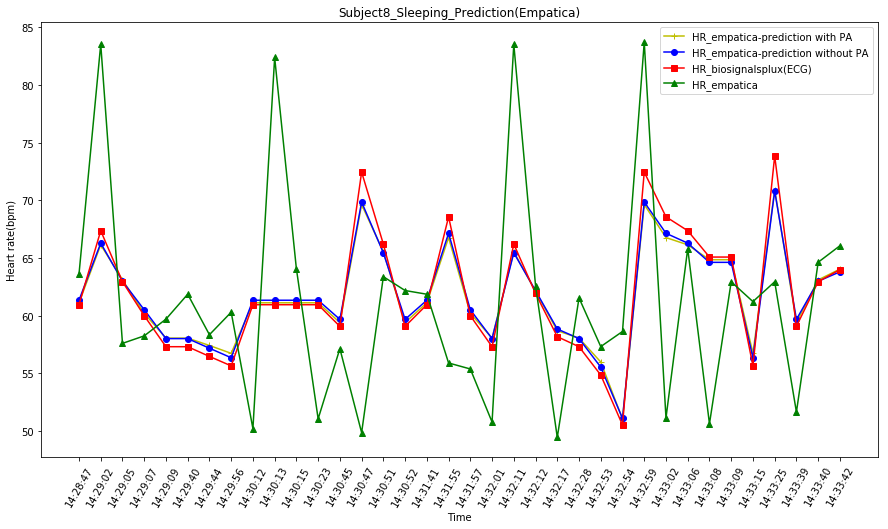

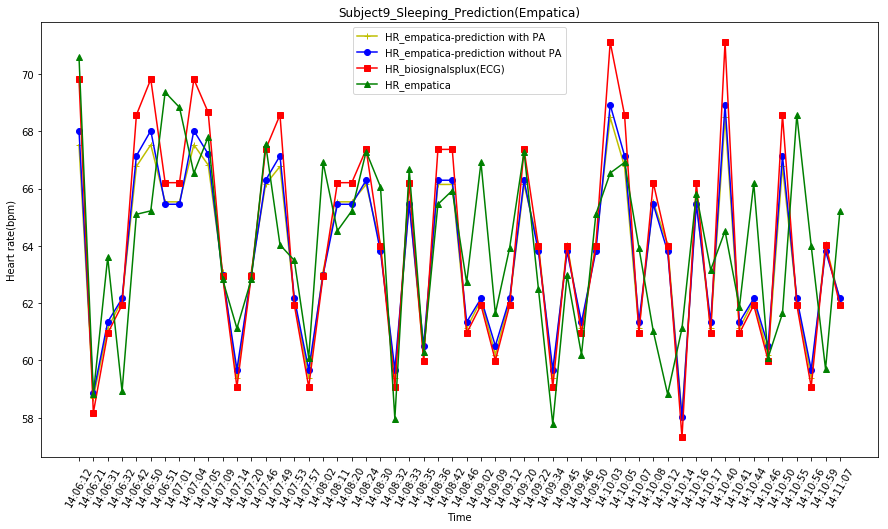

In [9]:
plot_empatica("Sleeping")

Prediction_['PA_lvl_VectorA_empatica_encoded', 'HR_fitbit']
Prediction_['HR_fitbit']


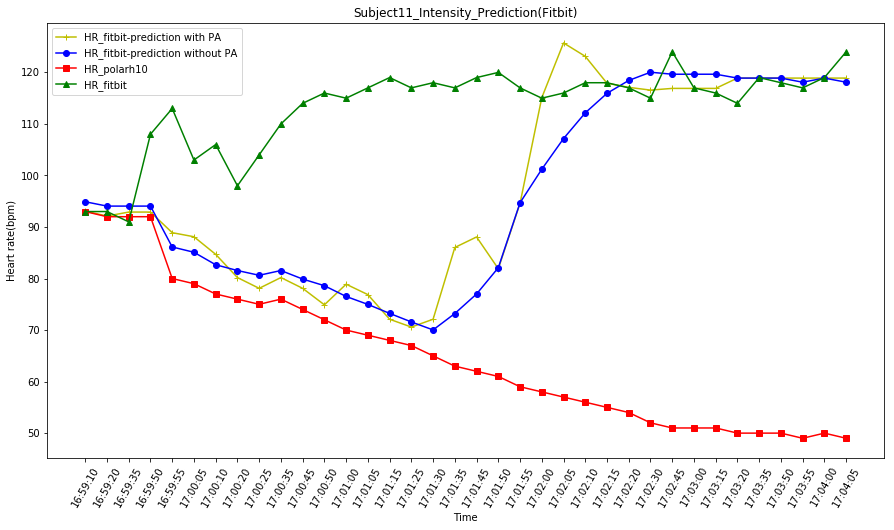

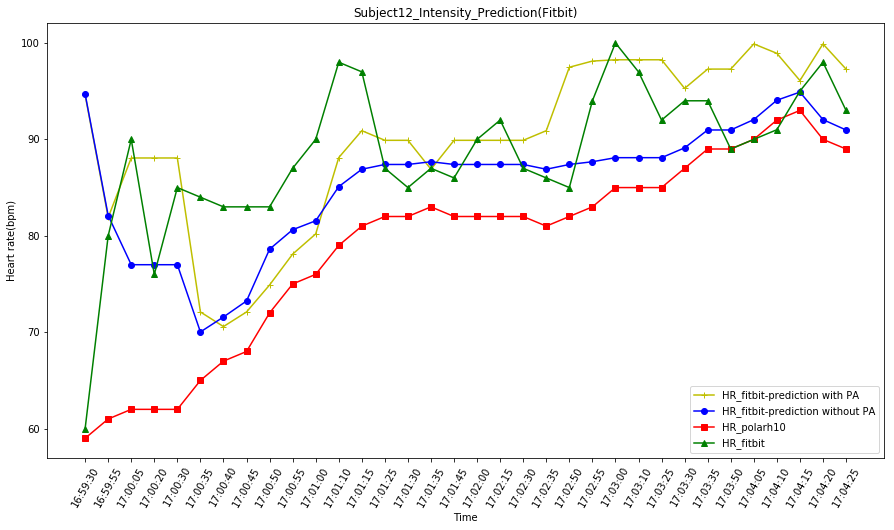

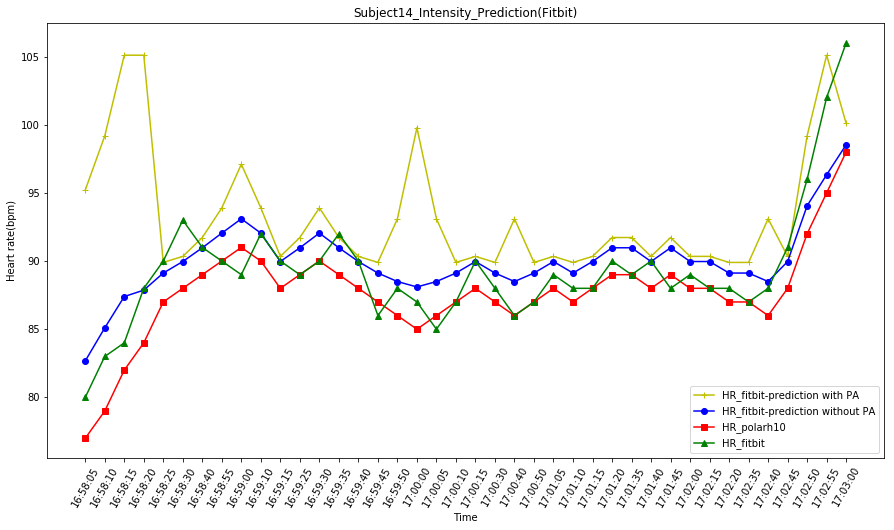

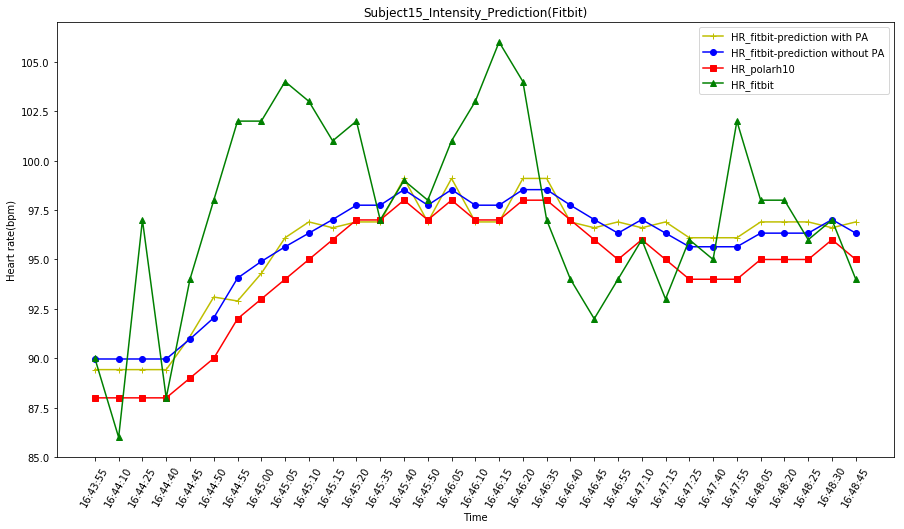

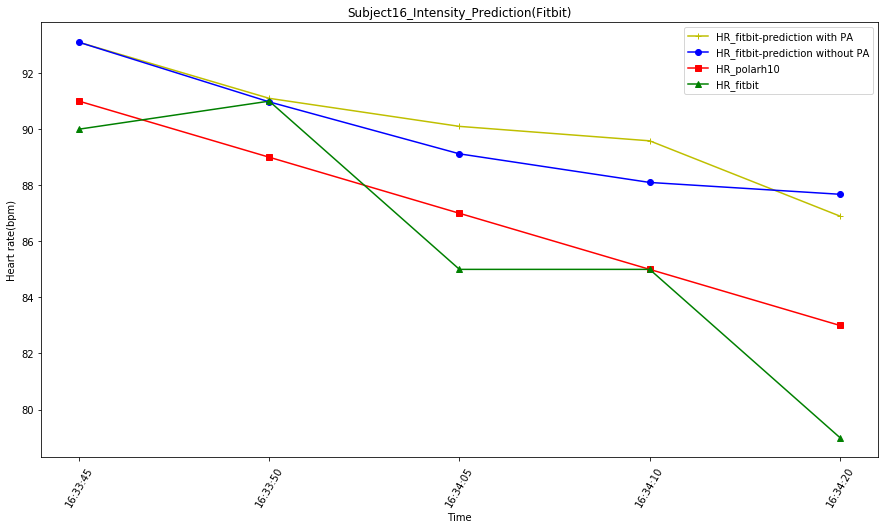

...

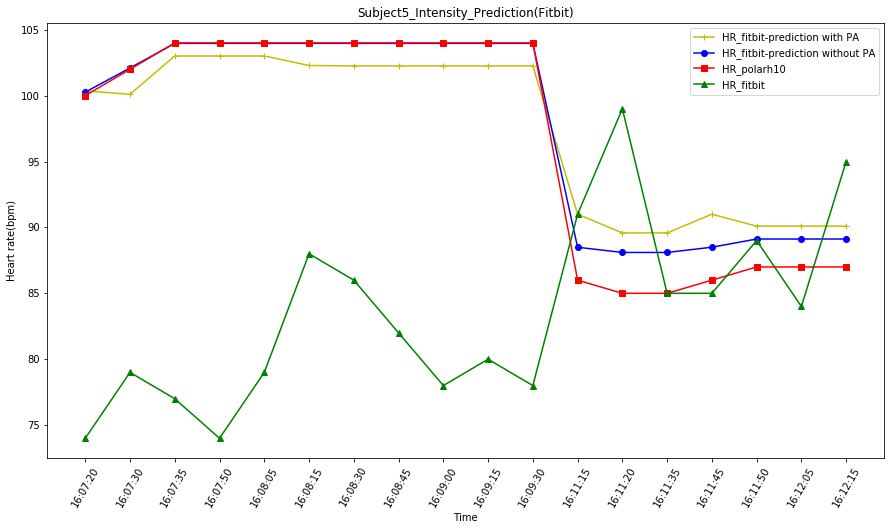

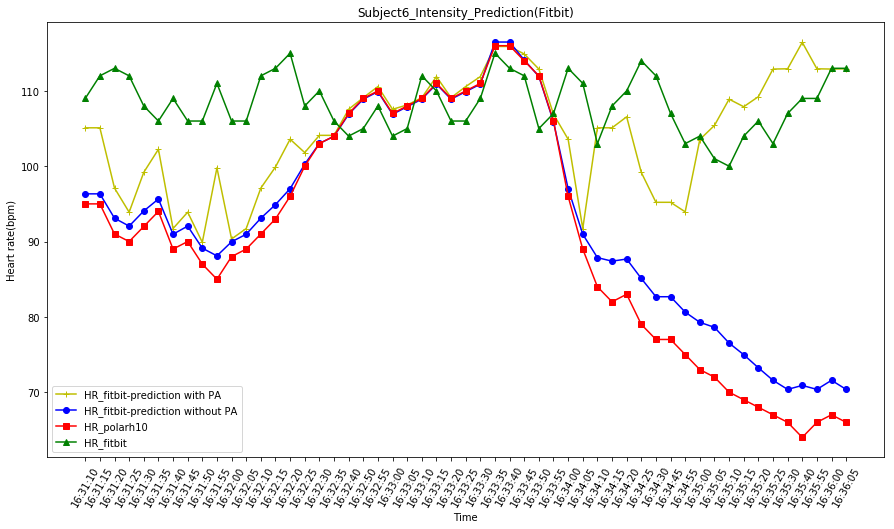

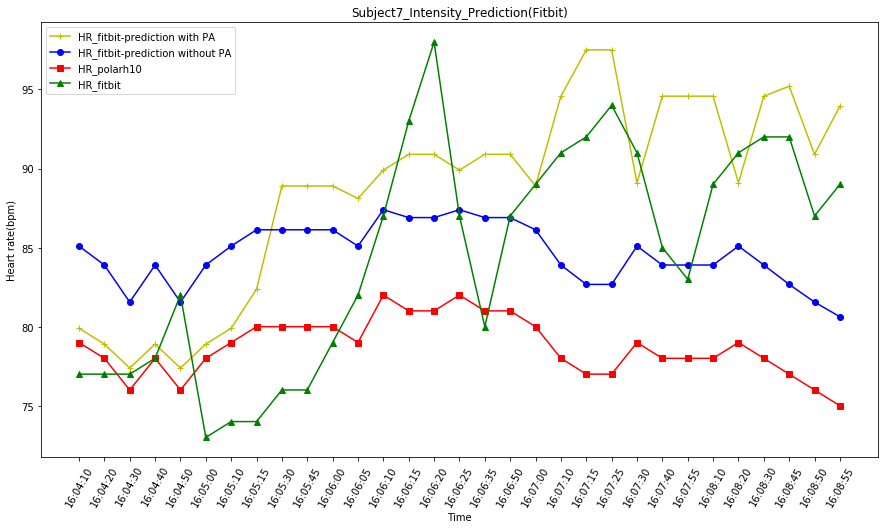

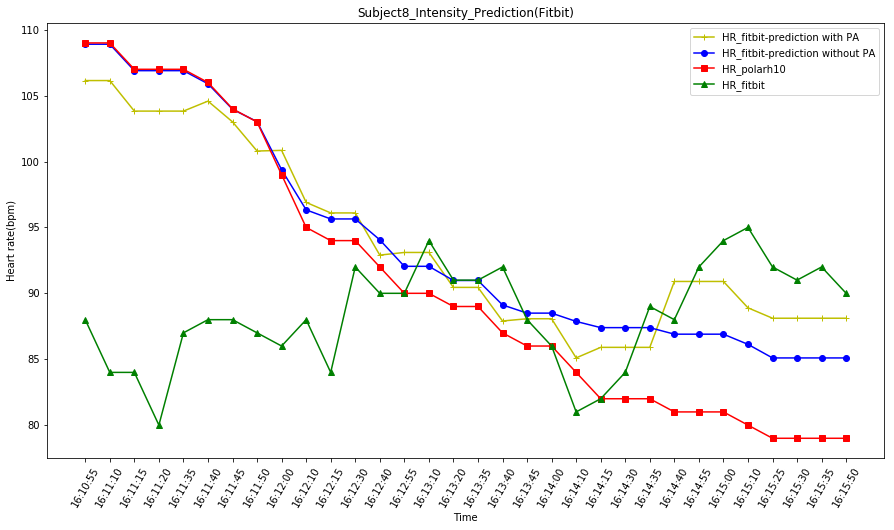

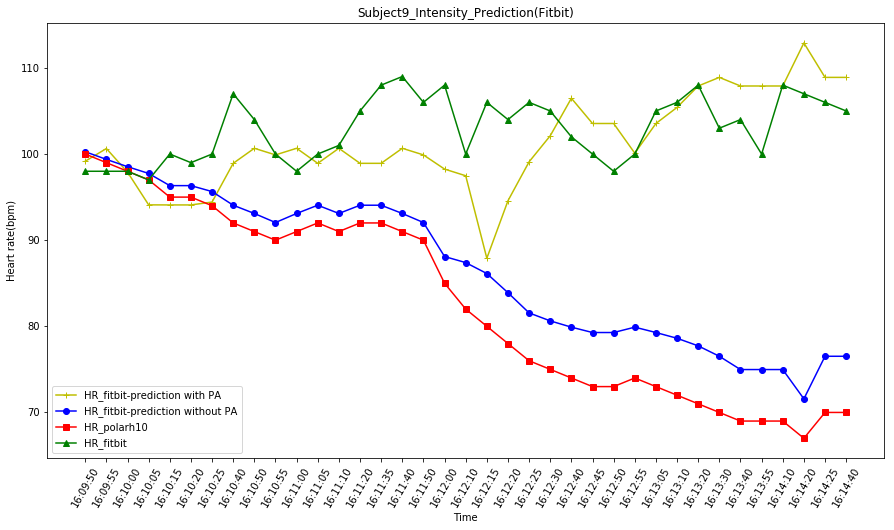

In [10]:
plot_fitbit("Intensity")

Prediction_['PA_lvl_VectorA_empatica_encoded', 'HR_fitbit']
Prediction_['HR_fitbit']
Prediction_['PA_lvl_VectorA_empatica_encoded', 'HR_fitbit']
Prediction_['HR_fitbit']


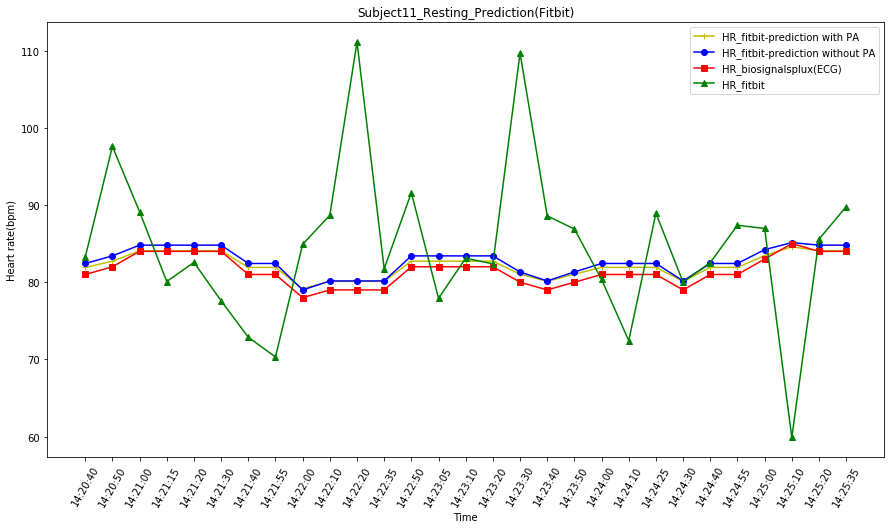

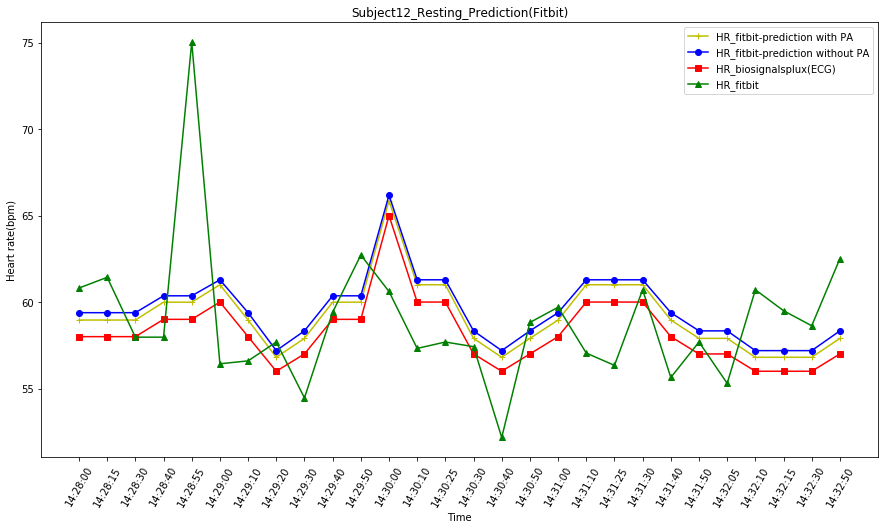

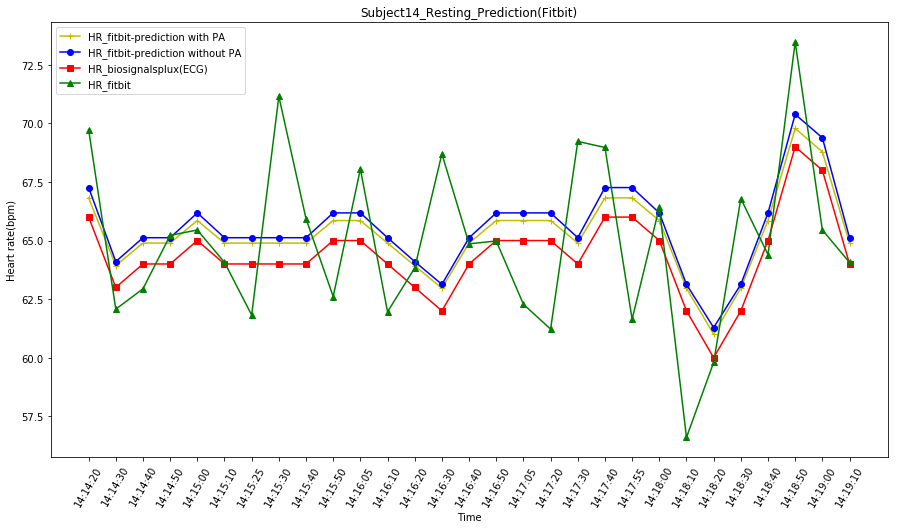

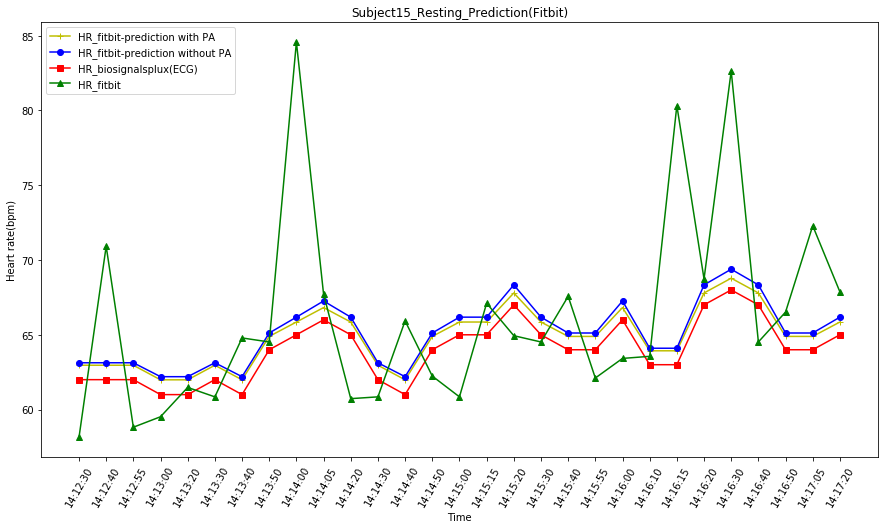

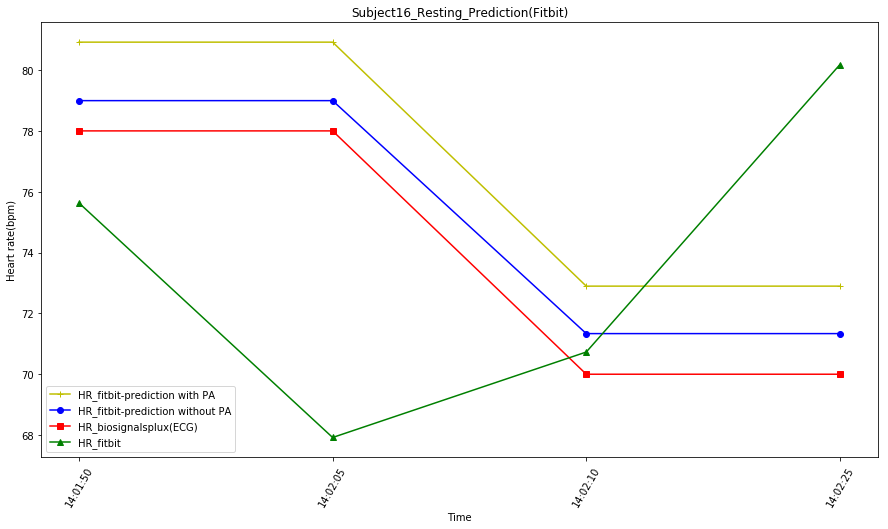

...

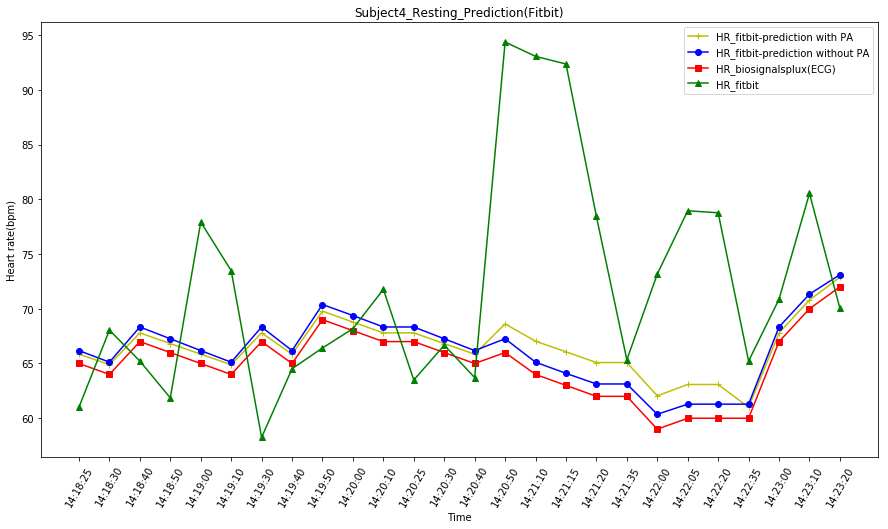

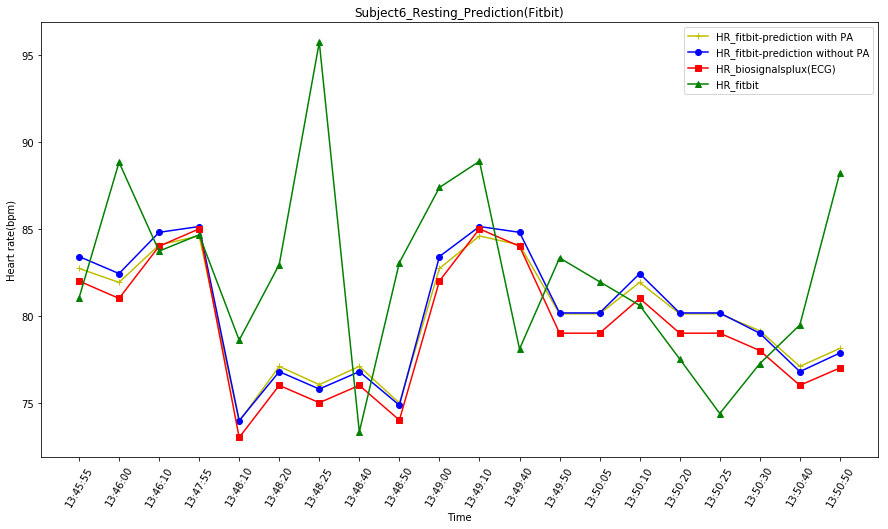

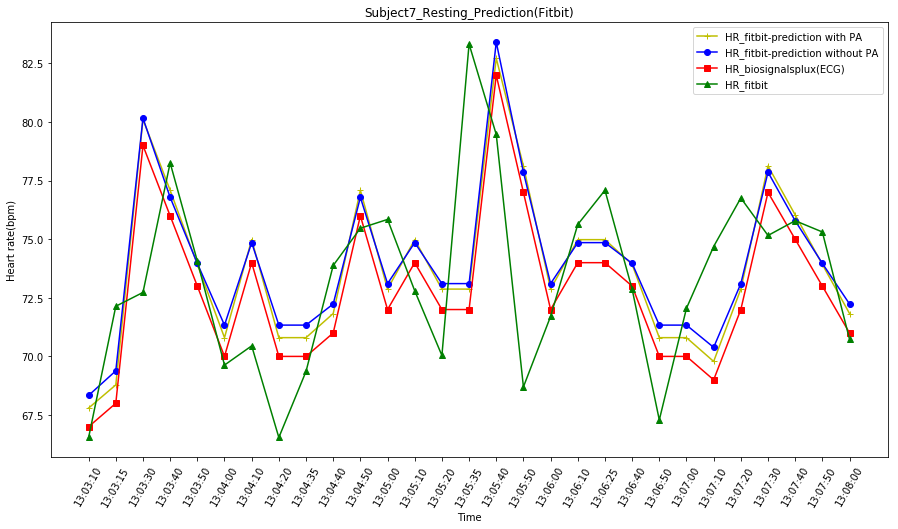

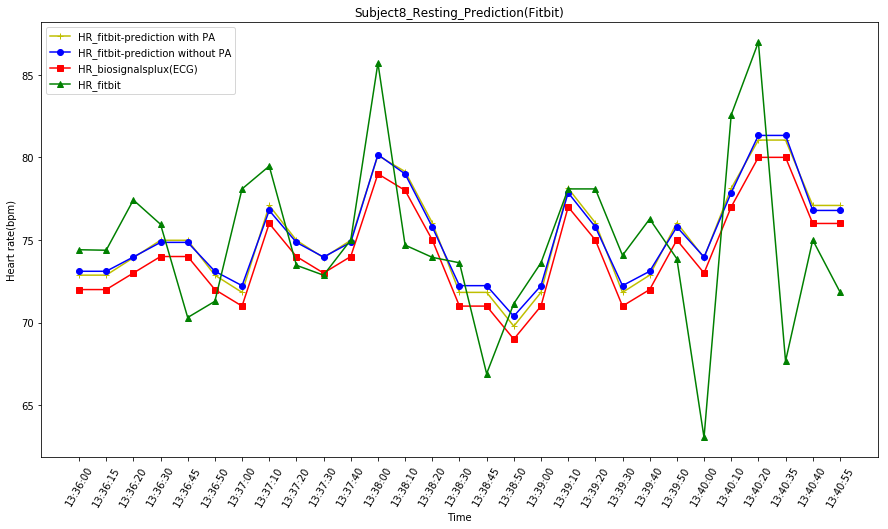

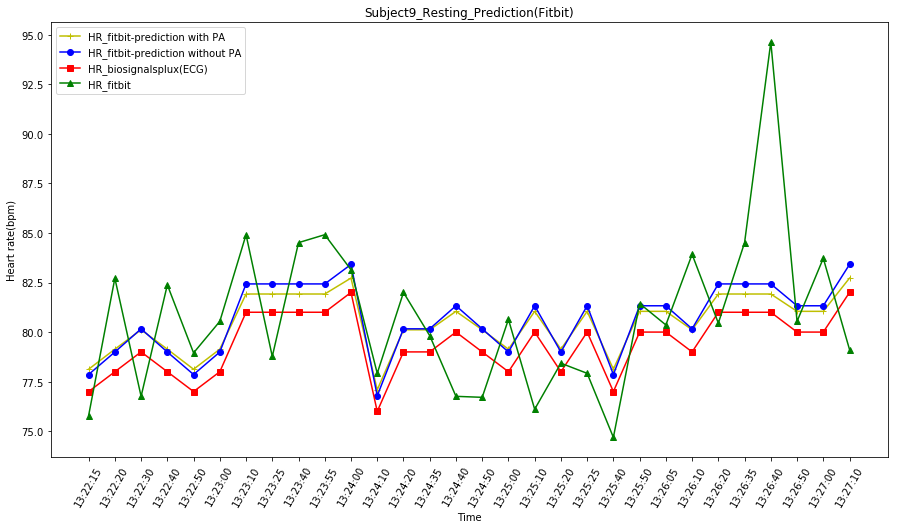

In [11]:
plot_fitbit("Resting")

Prediction_['PA_lvl_VectorA_empatica_encoded', 'HR_fitbit']
Prediction_['HR_fitbit']
Prediction_['PA_lvl_VectorA_empatica_encoded', 'HR_fitbit']
Prediction_['HR_fitbit']
Prediction_['PA_lvl_VectorA_empatica_encoded', 'HR_fitbit']
Prediction_['HR_fitbit']


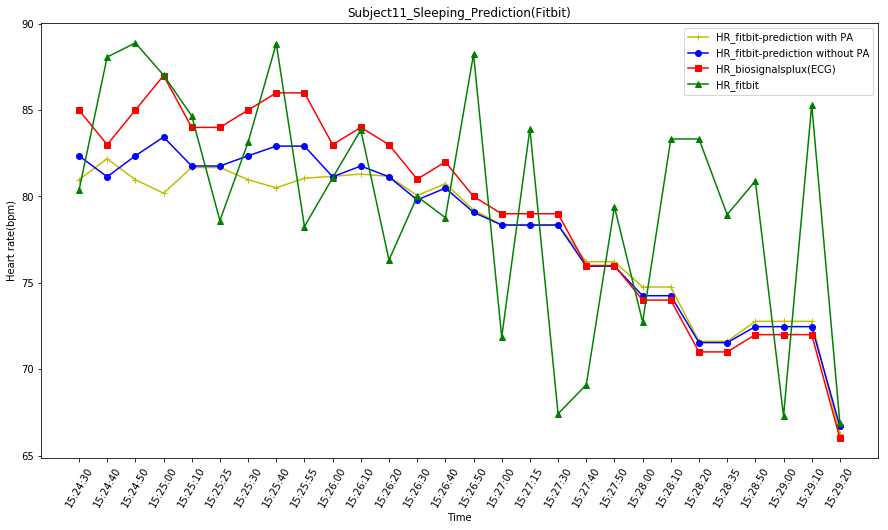

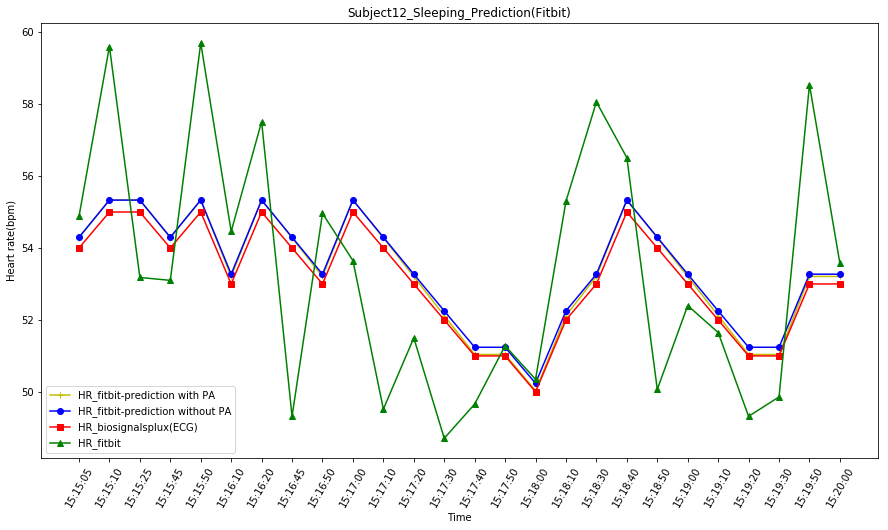

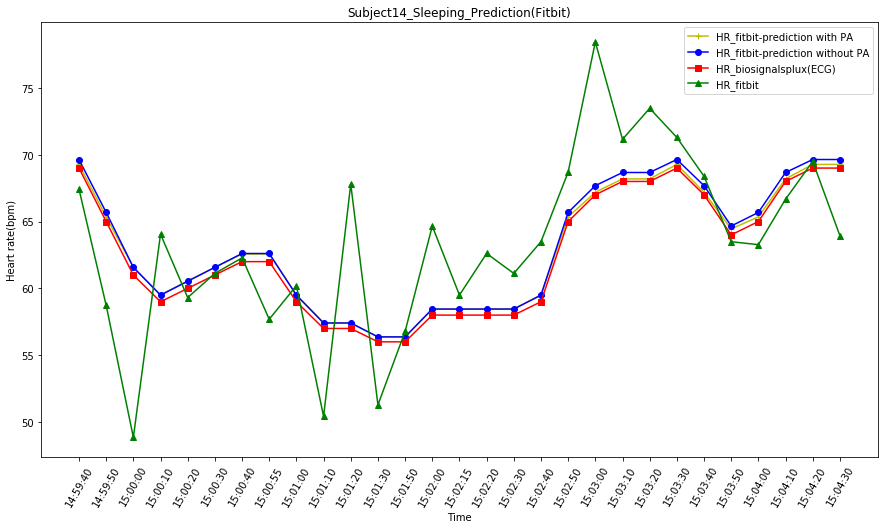

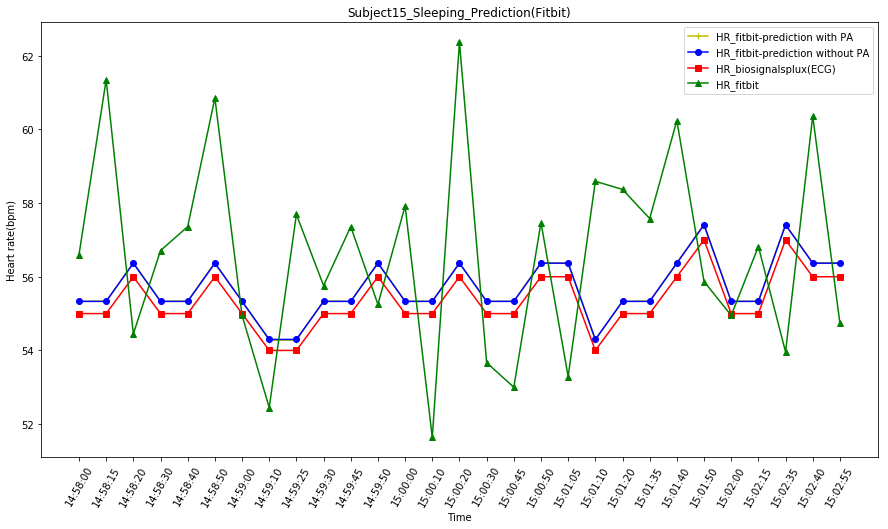

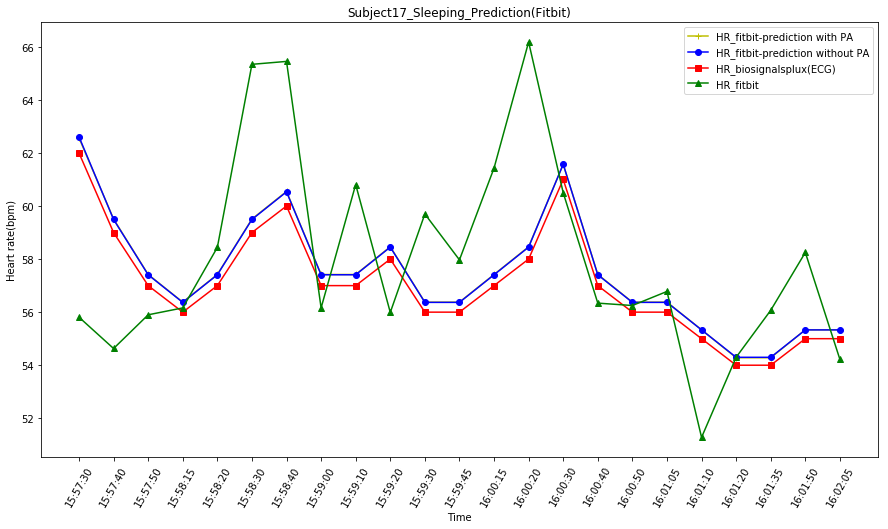

...

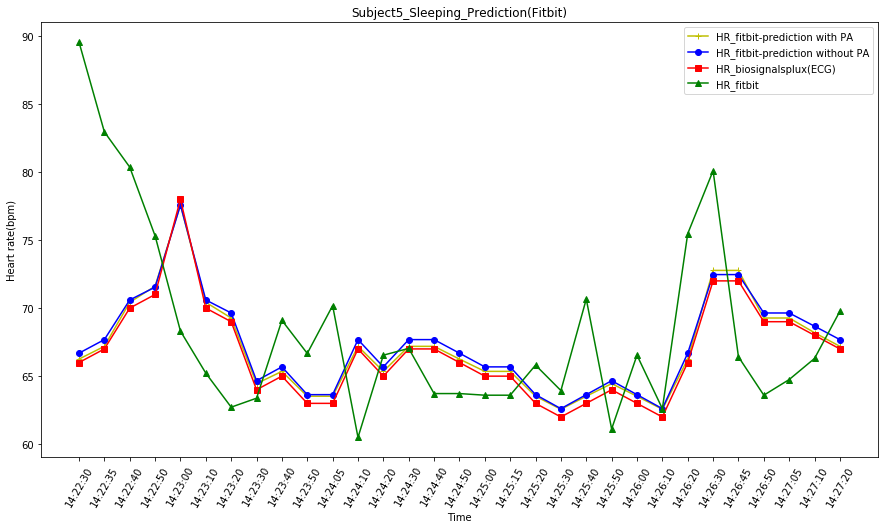

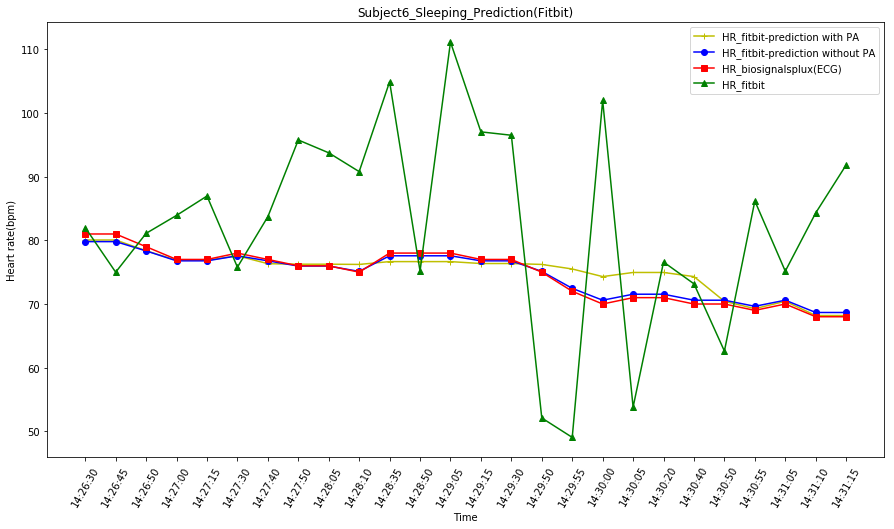

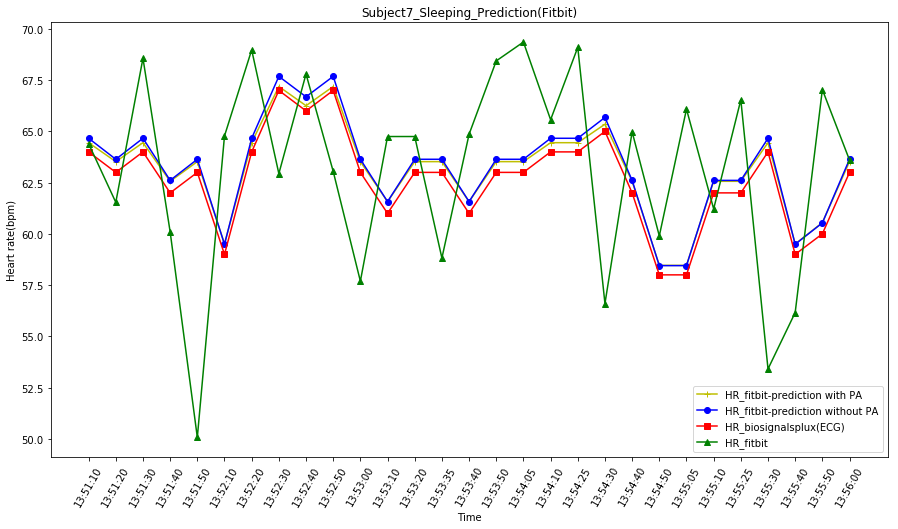

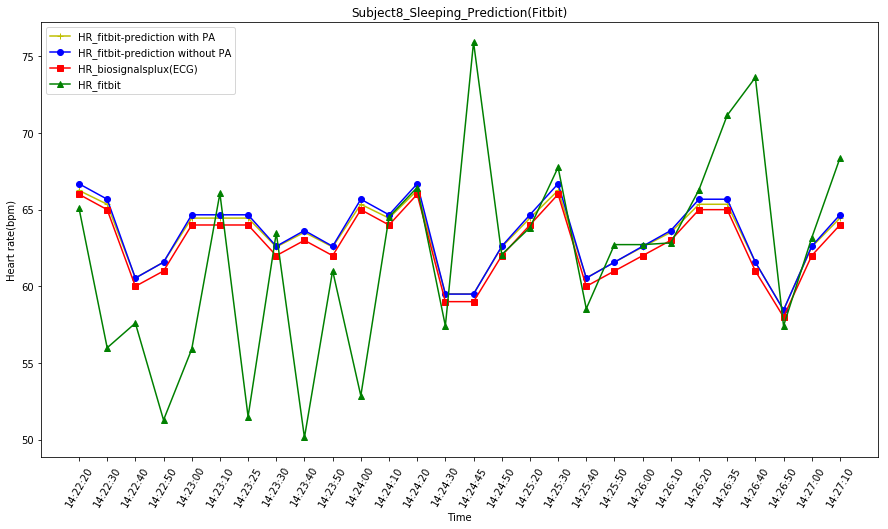

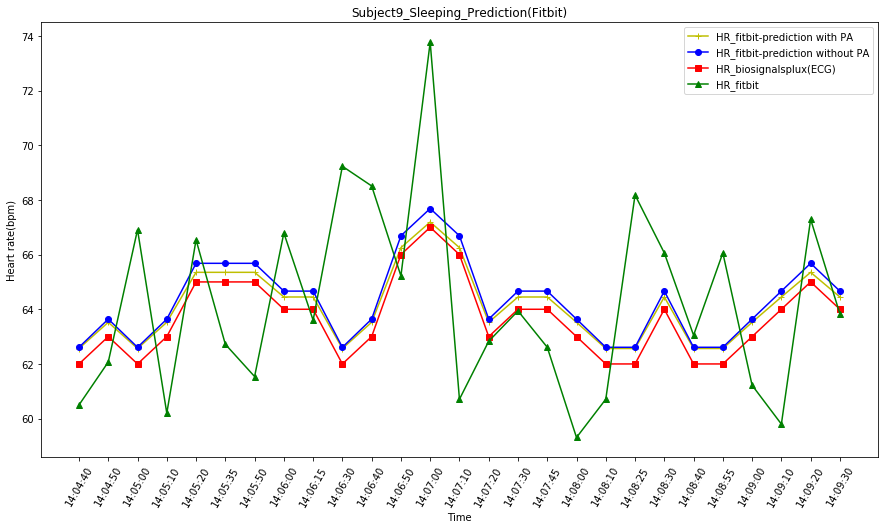

In [12]:
plot_fitbit("Sleeping")

In [ ]:
def plot_fitbit(sub):
    sub_path = os.path.join(fitbit_path, sub)
    fitbit_files = os.listdir(sub_path)
    fitbit_files.sort()
    
    tmp_data = [(file, pd.read_csv(os.path.join(sub_path, file))) for file in fitbit_files]
    fitbit_data = []
    for data in tmp_data:
        tmp_cols = data[1].columns.tolist()
        is_complete = True
        if sub.lower() == "intensity":
            needed_cols = fitbit_intense_cols
        else:
            needed_cols = fitbit_rest_cols
        for col in needed_cols:
            if col not in tmp_cols:
                print(col)
                is_complete = False
        if not is_complete:
            continue
        else:
            fitbit_data.append((data[0], data[1][needed_cols]))
    
    
    pick_index = []
    for data in fitbit_data:
        pick_index.append(pick_point_to_plot(data[1],5))


    for i, data in enumerate(fitbit_data):
        fitbit_data[i] = (data[0], data[1].iloc[pick_index[i][0]: pick_index[i][1]])
    
    return fitbit_data

    
    for data in fitbit_data:
        fig = plt.figure(figsize=(15,8))
        plt.plot(data[1]["Timestamp.time"], data[1]["Prediction_['PA_lvl_VectorA_empatica_encoded', 'HR_fitbit']"], "y+", label="HR_fitbit-prediction with PA", linestyle="-")
        plt.plot(data[1]["Timestamp.time"], data[1]["Prediction_['HR_fitbit']"], "bo", label="HR_fitbit-prediction without PA", linestyle="-")
        plt.plot(data[1]["Timestamp.time"], data[1]["HR_fitbit"], "rs", label="HR_fitbit", linestyle="-")
        
        if sub.lower() == "intensity":
            plt.plot(data[1]["Timestamp.time"], data[1]["HR_polarh10"], "g^", label="HR_polarh10", linestyle="-")
            plt.legend(("HR_fitbit-prediction with PA", "HR_fitbit-prediction without PA", "HR_polarh10", "HR_fitbit"))
        else:
            plt.plot(data[1]["Timestamp.time"], data[1]["HR_biosignalsplux"], "g^", label="HR_biosignalsplux(ECG)", linestyle="-")
            plt.legend(("HR_fitbit-prediction with PA", "HR_fitbit-prediction without PA", "HR_biosignalsplux(ECG)", "HR_fitbit"))
        
        plt.xticks(data[1]["Timestamp.time"], data[1]["Timestamp.time"], rotation="60")
        plt.title(data[0][:-4] + "(Fitbit)")
        plt.xlabel("Time")
        plt.ylabel("Heart rate(bpm)")
        plt.show()